# TFRecord

In [339]:
import tensorflow as tf
import tensorflow_hub as hub

import glob
import cv2
import numpy as np
import sys
import IPython.display as display
import PIL.Image as Image

tf.executing_eagerly()

print(tf.__version__)


2.0.0


# Tensorflow 2

## Load local files
Use this if you want to progress with your own images

In [345]:
data_path = "../../data/samples/"
files = [f for f in glob.glob(data_path + "*.jpg", recursive=True)]
print(len(files))
print(files)

2
['../../data/samples/995.jpg', '../../data/samples/9912.jpg']


## Load public files

In [374]:
misha1 = tf.keras.utils.get_file('misha01.jpg','https://storage.googleapis.com/ml-training-sascha/datasets/misha/misha1.jpg')
misha2 = tf.keras.utils.get_file('misha02.jpg','https://storage.googleapis.com/ml-training-sascha/datasets/misha/misha2.jpg')

In [375]:
files = [misha1, misha2]

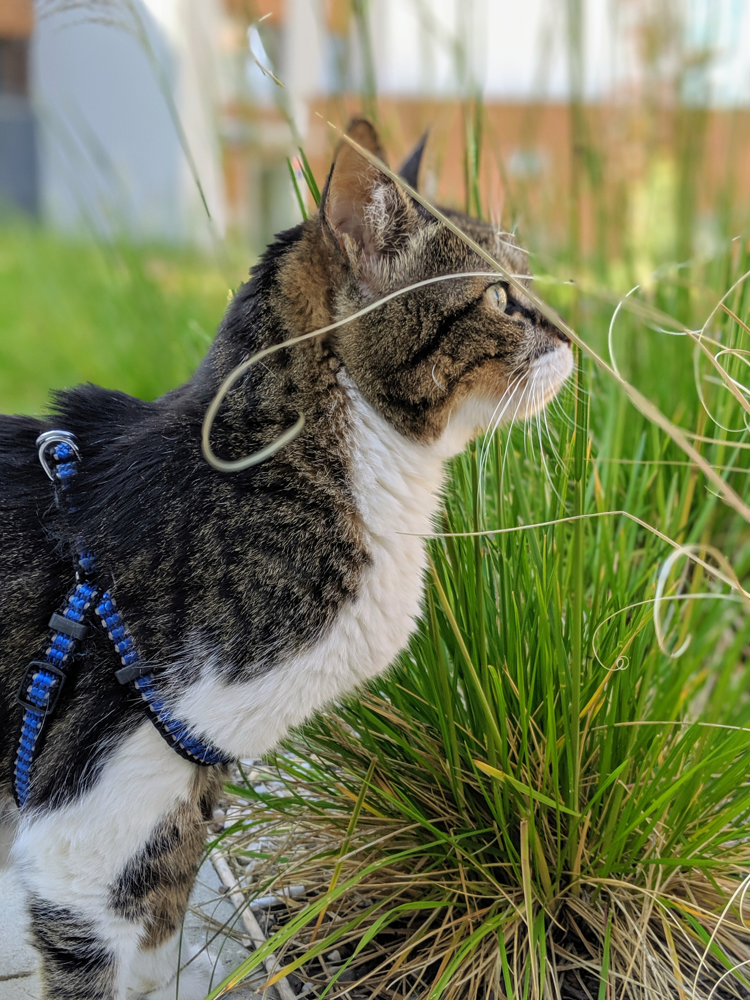

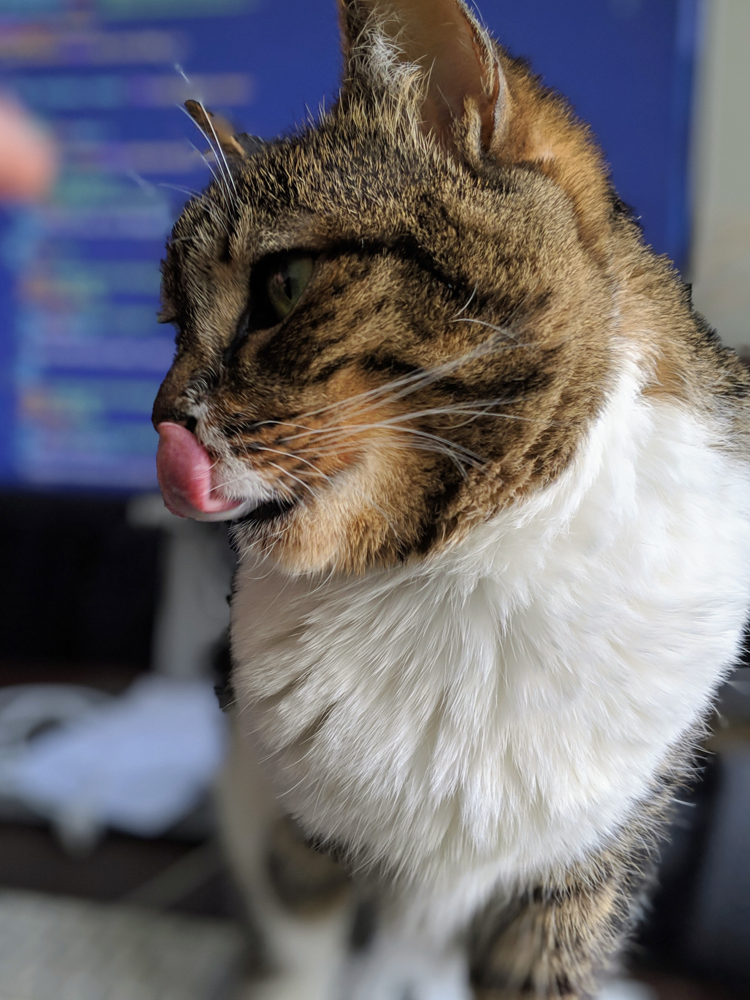

In [388]:
display.display(display.Image(filename=misha1,width=200))
display.display(display.Image(filename=misha2,width=200))

## Extract Features

In [389]:
IMAGE_SHAPE = (224, 224)
classifier_url = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"
classifier = tf.keras.Sequential([
    hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))
])

def extract_features(location):
    file = tf.io.gfile.GFile(location, "rb")
    file = Image.open(file).resize(IMAGE_SHAPE)
    file = np.array(file)/255.0
    embedding = classifier.predict(file[np.newaxis, ...])
    vgg16_feature_np = np.array(embedding)
    flattended_feature = vgg16_feature_np.flatten()

    return flattended_feature

## Write TFRecord

In [390]:
def _int64_feature(value):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

def _bytes_feature(value):
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _float_feature(value):
    return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

def _float_list_feature(values):
    return tf.train.Feature(float_list=tf.train.FloatList(value=values))

In [391]:
def image_example(image, embedding, location):
    feature = {
          'location': _bytes_feature(tf.compat.as_bytes(location)),
          'image': _bytes_feature(image),
          'embedding': _float_list_feature(embedding)
    }

    return tf.train.Example(features=tf.train.Features(feature=feature))

In [392]:
record_file = 'images.tfrecords' 

with tf.io.TFRecordWriter(record_file) as writer:
    for filename in files:
        print(filename)
        image = open(filename, 'rb').read()
        embedding = extract_features(filename)
        tf_example = image_example(image, embedding, filename)
        writer.write(tf_example.SerializeToString())

/Users/sheyer/.keras/datasets/misha01.jpg
/Users/sheyer/.keras/datasets/misha02.jpg


## TFRecord filesize

In [396]:
!du -sh {record_file}

5,1M	images.tfrecords


## Read the TFRecord

In [394]:
raw_image_dataset = tf.data.TFRecordDataset('images.tfrecords')

image_feature_description = {
    'location': tf.io.FixedLenFeature([], tf.string),
    'image': tf.io.FixedLenFeature([], tf.string),
    'embedding': tf.io.FixedLenFeature([1280], tf.float32),
}

def _parse_image_function(example_proto):
  # Parse the input tf.Example proto using the dictionary above.
  return tf.io.parse_single_example(example_proto, image_feature_description)

parsed_image_dataset = raw_image_dataset.map(_parse_image_function)
parsed_image_dataset

<MapDataset shapes: {embedding: (1280,), image: (), location: ()}, types: {embedding: tf.float32, image: tf.string, location: tf.string}>

tf.Tensor(b'/Users/sheyer/.keras/datasets/misha01.jpg', shape=(), dtype=string)
tf.Tensor([0.11708731 1.0643716  0.         ... 3.16278    0.         1.4263508 ], shape=(1280,), dtype=float32)


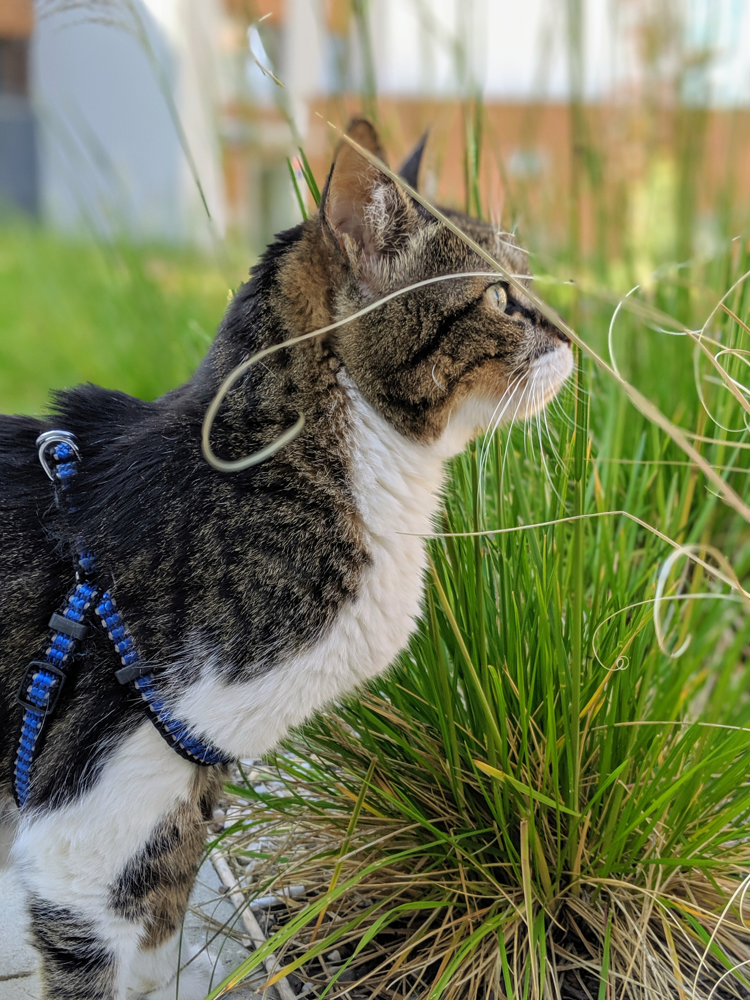

tf.Tensor(b'/Users/sheyer/.keras/datasets/misha02.jpg', shape=(), dtype=string)
tf.Tensor([0.8837354  1.5521064  0.         ... 2.0426435  0.3033189  0.36568576], shape=(1280,), dtype=float32)


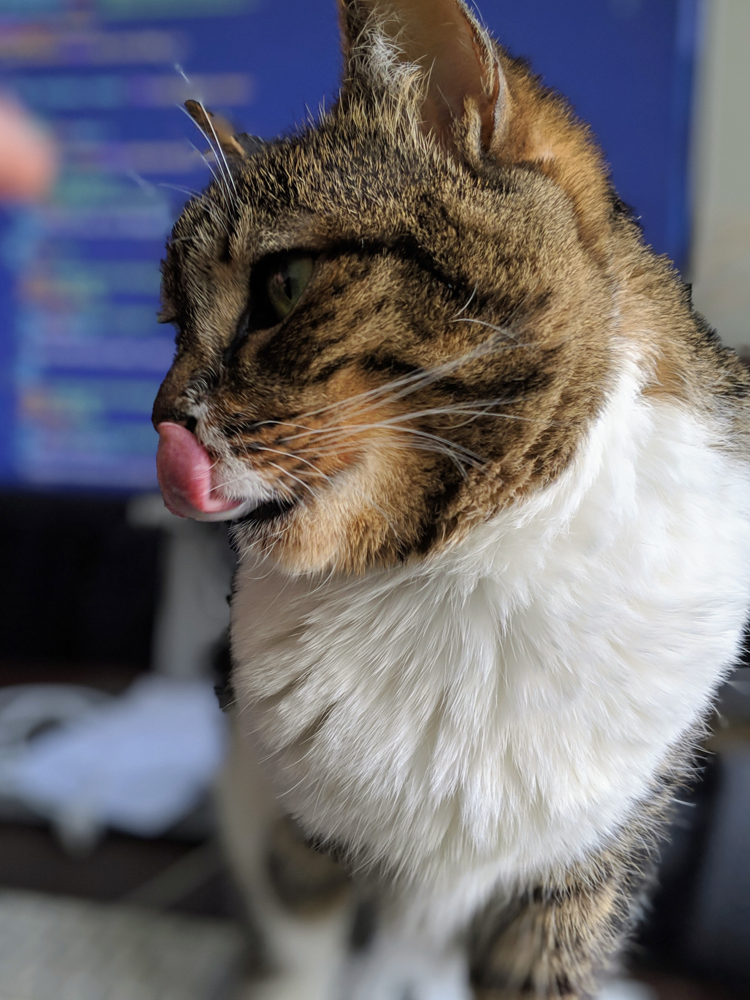

In [395]:
for image_features in parsed_image_dataset:
    image_raw = image_features['image'].numpy()
    location = image_features['location']
    embedding = image_features['embedding']
    print(location)
    print(embedding)
    display.display(display.Image(data=image_raw,width=200))
    